## Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [171]:
import os
import re
import csv
import numpy as np
import pandas as pd
import pickle as pkl
from datetime import datetime
from dateutil import parser

import operator
from scipy import stats

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 8.0)
plt.rcParams['axes.axisbelow'] = True

from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import plotly.io as pio
from plotly.subplots import make_subplots
init_notebook_mode(True)

from hallprobecalib import hpc_ext_path
from hallprobecalib.hpcplots import scatter2d,scatter3d,histo

## Get All Filenames

In [4]:
plotdir = hpc_ext_path+'plots/magnet_stability/all_fms58/'

In [92]:
directory = "/home/ckampa/Dropbox/LogFiles/"
pkldir = hpc_ext_path+"datafiles/magnet_stability/pkl/"

In [83]:
regex = re.compile("^2019.*[6-8].\d{2} .*slow\.txt$")

In [84]:
files_list = sorted([f for f in os.listdir(directory) if regex.match(f)])

In [85]:
files_list

['2019-06-12 115902slow.txt',
 '2019-06-14 083830slow.txt',
 '2019-06-19 075455slow.txt',
 '2019-06-19 161911slow.txt',
 '2019-06-24 080033slow.txt',
 '2019-06-26 145723slow.txt',
 '2019-07-02 112857slow.txt',
 '2019-07-02 150753slow.txt',
 '2019-07-02 151328slow.txt',
 '2019-07-08 152420slow.txt',
 '2019-07-10 161439slow.txt',
 '2019-07-15 081357slow.txt',
 '2019-07-16 101205slow.txt',
 '2019-08-01 081432slow.txt']

In [86]:
# remove empty runs
files_list.remove('2019-06-19 075455slow.txt')
files_list.remove('2019-07-02 112857slow.txt')

files_list.remove('2019-07-02 150753slow.txt') # unsure...

In [87]:
files_list

['2019-06-12 115902slow.txt',
 '2019-06-14 083830slow.txt',
 '2019-06-19 161911slow.txt',
 '2019-06-24 080033slow.txt',
 '2019-06-26 145723slow.txt',
 '2019-07-02 151328slow.txt',
 '2019-07-08 152420slow.txt',
 '2019-07-10 161439slow.txt',
 '2019-07-15 081357slow.txt',
 '2019-07-16 101205slow.txt',
 '2019-08-01 081432slow.txt']

In [88]:
len(files_list)

11

In [165]:
df = []
df_full = []
durations = []

for i,f in enumerate(files_list):
    df_ = pd.read_csv(directory+f)
    df_full_ = pd.read_csv(directory+f)
    run = i+1
    df_["run"] = run
    df_full_["run"] = run
    print(len(df_))
    dates = [parser.parse(row.Time) for row in df_.itertuples()]
    df_["Datetime"] = pd.to_datetime(dates)#.astype("str")
    df_ = df_.set_index("Datetime")
    df_full_["Datetime"] = pd.to_datetime(dates)#.astype("str")
    df_full_ = df_full_.set_index("Datetime")
    
    df_ = df_[df_[" NMR [T]"] != 0]
    # remove outliers
    df_["outlier"] = (df_[" NMR [T]"] < df_[" NMR [T]"].mean()-10*df_[" NMR [T]"].std()) | (df_[" NMR [T]"] > df_[" NMR [T]"].mean()+10*df_[" NMR [T]"].std())
    df_ = df_[df_["outlier"] == False]
    
    durations.append(df_.index[-1] - df_.index[0])
    print(f"File: {f}, Duration: {durations[-1]}, Mean: {df_[' NMR [T]'].mean()}, Std: {df_[' NMR [T]'].std()}")
    df.append(df_)
    df_full.append(df_full_)
    
    df_full_.to_pickle(pkldir+f"run{i+1:02d}_full.pkl")
    df_.to_pickle(pkldir+f"run{i+1:02d}.pkl")

1634
File: 2019-06-12 115902slow.txt, Duration: 1 days 03:11:02, Mean: 1.3187475896862746, Std: 2.1112028202918456e-05
6241
File: 2019-06-14 083830slow.txt, Duration: 4 days 07:59:06, Mean: 1.3187517164512508, Std: 2.6123862351498302e-05
1111
File: 2019-06-19 161911slow.txt, Duration: 0 days 18:30:01, Mean: 1.3186131965562558, Std: 1.0596733778703757e-05
3294
File: 2019-06-24 080033slow.txt, Duration: 1 days 08:40:02, Mean: 1.318613553956145, Std: 2.97943305317782e-05
8430
File: 2019-06-26 145723slow.txt, Duration: 5 days 20:27:01, Mean: 1.2866506355544614, Std: 0.00019124921543242038
8181
File: 2019-07-02 151328slow.txt, Duration: 0 days 05:40:00, Mean: 1.2864364160791788, Std: 6.137782979425112e-06
2234
File: 2019-07-08 152420slow.txt, Duration: 1 days 13:10:02, Mean: 1.2493655878860985, Std: 0.00024121169454242156
6108
File: 2019-07-10 161439slow.txt, Duration: 4 days 05:45:07, Mean: 1.2491830337128111, Std: 2.139002634590179e-05
1554
File: 2019-07-15 081357slow.txt, Duration: 1 day

In [166]:
df[11-1] = df[11-1].loc['2019-08-02 05:00:00':]

In [167]:
df[11-1].to_pickle(pkldir+f"run11.pkl")

In [168]:
# test pickled files
df = []
df_full = []
durations = []

for i in range(len(files_list)):
    f = f"run{i+1:02d}"
    df_ = pd.read_pickle(pkldir+f+".pkl")
    df_full_ = pd.read_pickle(pkldir+f+"_full.pkl")
    print(len(df_full_))
    #dates = [parser.parse(row.Time) for row in df_.itertuples()]
    #df_["Datetime"] = pd.to_datetime(dates)#.astype("str")
    #df_ = df_.set_index("Datetime")
    #df_full_["Datetime"] = pd.to_datetime(dates)#.astype("str")
    #df_full_ = df_full_.set_index("Datetime")
    
    #df_ = df_[df_[" NMR [T]"] != 0]
    durations.append(df_.index[-1] - df_.index[0])
    print(f"File: {f}, Duration: {durations[-1]}, Mean: {df_[' NMR [T]'].mean()}, Std: {df_[' NMR [T]'].std()}")
    df.append(df_)
    df_full.append(df_full_)
    
    #df_full_.to_pickle(pkldir+f"run{i+1:02d}_full.pkl")
    #df_.to_pickle(pkldir+f"run{i+1:02d}.pkl")

1634
File: run01, Duration: 1 days 03:11:02, Mean: 1.3187475896862746, Std: 2.1112028202918456e-05
6241
File: run02, Duration: 4 days 07:59:06, Mean: 1.3187517164512508, Std: 2.6123862351498302e-05
1111
File: run03, Duration: 0 days 18:30:01, Mean: 1.3186131965562558, Std: 1.0596733778703757e-05
3294
File: run04, Duration: 1 days 08:40:02, Mean: 1.318613553956145, Std: 2.97943305317782e-05
8430
File: run05, Duration: 5 days 20:27:01, Mean: 1.2866506355544614, Std: 0.00019124921543242038
8181
File: run06, Duration: 0 days 05:40:00, Mean: 1.2864364160791788, Std: 6.137782979425112e-06
2234
File: run07, Duration: 1 days 13:10:02, Mean: 1.2493655878860985, Std: 0.00024121169454242156
6108
File: run08, Duration: 4 days 05:45:07, Mean: 1.2491830337128111, Std: 2.139002634590179e-05
1554
File: run09, Duration: 1 days 01:53:01, Mean: 1.249119921943372, Std: 8.969873971127074e-06
21977
File: run10, Duration: 14 days 23:11:18, Mean: 1.2492020688545844, Std: 5.628774812934564e-05
4960
File: run11

In [97]:
files_dict = {f"run{i+1:02d}": f for i,f in enumerate(files_list)}

In [98]:
files_dict

{'run01': '2019-06-12 115902slow.txt',
 'run02': '2019-06-14 083830slow.txt',
 'run03': '2019-06-19 161911slow.txt',
 'run04': '2019-06-24 080033slow.txt',
 'run05': '2019-06-26 145723slow.txt',
 'run06': '2019-07-02 151328slow.txt',
 'run07': '2019-07-08 152420slow.txt',
 'run08': '2019-07-10 161439slow.txt',
 'run09': '2019-07-15 081357slow.txt',
 'run10': '2019-07-16 101205slow.txt',
 'run11': '2019-08-01 081432slow.txt'}

In [113]:
csv_columns = ["Run Name", "Filename"]

In [101]:
csv_file = hpc_ext_path+"datafiles/magnet_stability/runs_list.csv"

In [114]:
with open(csv_file, "w") as csvfile:
    writer = csv.writer(csvfile, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
    writer.writerow(csv_columns)
    for row,data in files_dict.items():
        writer.writerow([row,data])

In [109]:
for row,data in files_dict.items():
    print ({row:data})

{'run01': '2019-06-12 115902slow.txt'}
{'run02': '2019-06-14 083830slow.txt'}
{'run03': '2019-06-19 161911slow.txt'}
{'run04': '2019-06-24 080033slow.txt'}
{'run05': '2019-06-26 145723slow.txt'}
{'run06': '2019-07-02 151328slow.txt'}
{'run07': '2019-07-08 152420slow.txt'}
{'run08': '2019-07-10 161439slow.txt'}
{'run09': '2019-07-15 081357slow.txt'}
{'run10': '2019-07-16 101205slow.txt'}
{'run11': '2019-08-01 081432slow.txt'}


## Analyze!

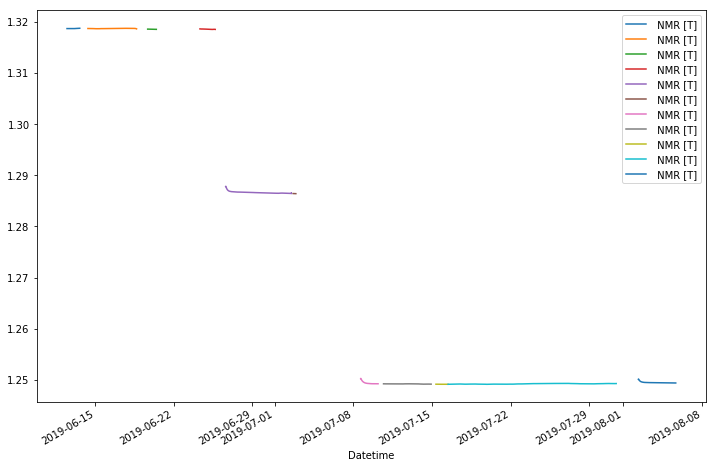

In [169]:
for df_ in df:
    df_[" NMR [T]"].plot()

plt.legend()

In [210]:
legends = [f"run{df_.iloc[0].run:02d}" for df_ in df]
fig = scatter2d([df_.index for df_ in df], [df_["NMR_const"] for df_ in df], legend_list=legends, inline=True)

In [211]:
fname = "NMR_const_all_runs"
pio.write_image(fig,plotdir+f"{fname}.pdf")
pio.write_image(fig,plotdir+f"{fname}.png")

In [208]:
legends = [f"run{df_.iloc[0].run:02d}" for df_ in df]
fig = scatter2d([df_.index for df_ in df], [df_[" NMR [T]"] for df_ in df], legend_list=legends, inline=True)

In [209]:
fname = "NMR_all_runs"
pio.write_image(fig,plotdir+f"{fname}.pdf")
pio.write_image(fig,plotdir+f"{fname}.png")

In [177]:
df[9].head()

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,NMR [FFT],Zaber_Meas_MicroStep_X,Zaber_Meas_Encoder_X,Zaber_Meas_MicroStep_Y,Zaber_Meas_Encoder_Y,Zaber_Meas_MicroStep_Z,Zaber_Meas_Encoder_Z,,run,outlier
Datetime,,,,,,,,,,,,,,,,,,,,,
2019-07-16 10:12:40,7/16/2019 10:12:40 AM,256.069238,33.803850,55.239761,52.688934,31.030971,34.043785,32.280407,38.443527,29.436894,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False
2019-07-16 10:13:40,7/16/2019 10:13:40 AM,256.069310,33.803700,55.233868,52.673191,31.029926,34.037178,32.402508,38.393867,29.435436,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False
2019-07-16 10:14:40,7/16/2019 10:14:40 AM,256.069224,33.803700,55.229145,52.680092,31.013575,34.047707,32.277966,38.459206,29.444553,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False
2019-07-16 10:15:40,7/16/2019 10:15:40 AM,256.069285,33.803833,55.199894,52.724766,31.009970,34.055397,32.232929,38.468384,29.450718,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False
2019-07-16 10:16:40,7/16/2019 10:16:40 AM,256.069277,33.803800,55.242519,52.758240,31.042023,34.066185,32.286911,38.431835,29.435515,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False


In [179]:
df[4].tail()

,Time,Magnet Current [V],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,NMR [FFT],Zaber_Meas_MicroStep_X,Zaber_Meas_Encoder_X,Zaber_Meas_MicroStep_Y,Zaber_Meas_Encoder_Y,Zaber_Meas_MicroStep_Z,Zaber_Meas_Encoder_Z,,run,outlier
Datetime,,,,,,,,,,,,,,,,,,,,,
2019-07-02 11:23:07,7/2/2019 11:23:07 AM,8.002161,36.177883,56.918156,54.252682,28.988747,32.504505,31.405323,37.532562,28.763899,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,5,False
2019-07-02 11:24:07,7/2/2019 11:24:07 AM,8.002166,36.176850,57.029785,54.290592,29.031631,32.553291,31.448574,37.519314,28.812942,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,5,False
2019-07-02 11:25:07,7/2/2019 11:25:07 AM,8.002164,36.176800,57.031075,54.338486,28.993156,32.450108,31.410564,37.483032,28.817726,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,5,False
2019-07-02 11:26:07,7/2/2019 11:26:07 AM,8.002162,36.176750,57.130016,54.256332,29.021313,32.540894,31.398111,37.539173,28.828201,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,5,False
2019-07-02 11:27:07,7/2/2019 11:27:07 AM,8.002162,36.176767,57.246475,54.339340,29.071051,32.537403,31.345425,37.548058,28.851336,...,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,5,False


In [139]:
for df_, duration in zip(df, durations):
    print(len(df_), duration.days*24*60 + duration.seconds/60)

1632 1631.0333333333333
6238 6240.15
1111 1110.0166666666667
1961 1960.0333333333333
8428 8427.016666666666
341 340.0
2230 2230.0333333333333
6105 6105.116666666667
1554 1553.0166666666667
21552 21551.3
3193 4789.266666666666


This shows that only the last dataset is messy....should probably just cut off the first chunk of that dataset.

In [170]:
for i,df_ in enumerate(df):
    #outliers_mask = (df_[" NMR [T]"] < df_[" NMR [T]"].mean()-10*df_[" NMR [T]"].std()) | (df_[" NMR [T]"] > df_[" NMR [T]"].mean()+10*df_[" NMR [T]"].std())
    df_["outlier"] = (df_[" NMR [T]"] < df_[" NMR [T]"].mean()-10*df_[" NMR [T]"].std()) | (df_[" NMR [T]"] > df_[" NMR [T]"].mean()+10*df_[" NMR [T]"].std())
    print(f"run{df_.iloc[10].run:02d}: {df_['outlier'].sum()}")
    df_ = df_[df_["outlier"] == False]
    df[i] = df_
    print(f"run{df_.iloc[10].run:02d}: {df_['outlier'].sum()}")

run01: 0
run01: 0
run02: 0
run02: 0
run03: 0
run03: 0
run04: 0
run04: 0
run05: 0
run05: 0
run06: 0
run06: 0
run07: 0
run07: 0
run08: 0
run08: 0
run09: 0
run09: 0
run10: 0
run10: 0
run11: 0
run11: 0


In [184]:
num_points = []

for df_ in df:
    num_points.append(len(df_))

In [185]:
sum(num_points)

54342

In [187]:
total_minutes = []
for d in durations:
    total_minutes.append(d.days * 24 * 60 + d.seconds / 60)

In [190]:
sum(total_minutes)/60/24

38.84439814814815

In [191]:
sum(total_minutes)/60

932.2655555555556

In [193]:
sum(total_minutes)

55935.933333333334

### Correlations

In [195]:
for i,df_ in enumerate(df):
    primary_corr = dict()
    for col in df_.columns:
        if df_[col].dtype == np.float64:
            slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df_[col], df_[" NMR [T]"])
            #print(col,r_value_v,p_value_v,std_err_v)
            primary_corr[col] = [r_value_v, slope_v]
    sorted_primary_corr = sorted(primary_corr.items(), key=operator.itemgetter(1))
    
    _ = sorted_primary_corr[0]
    df[i]["corr_var"] = _[0]
    print(f"run{df_.iloc[0].run:02d}: {sorted_primary_corr[0]}")#,sorted_primary_corr[-3:]}")

run01: (' Yoke', [-0.9962006354616788, -0.00013457087368655445])
run02: (' Yoke', [-0.9678396981180972, -0.00014298791949202998])
run03: (' LCW in barrel', [-0.9766021068270715, -0.00010171542897449302])
run04: (' Yoke', [-0.9907719783018517, -0.00015219904462217726])
run05: (' Yoke', [-0.9972551021010468, -0.00013934299387596667])
run06: (' Floor', [-0.9898435805106839, -0.00010175862466569151])
run07: (' Floor', [-0.9993562391153072, -0.00016481642913080826])
run08: (' Yoke', [-0.99234903743285, -9.81020609492843e-05])
run09: (' Yoke', [-0.9794605354345829, -8.98716513735312e-05])
run10: (' Yoke', [-0.999430033495591, -0.00011182250848941633])
run11: ('Yoke (center magnet)', [-0.99940249462556, -0.00011239601612144192])


/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:107: RuntimeWarning:

invalid value encountered in double_scalars

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:119: RuntimeWarning:

divide by zero encountered in double_scalars



In [200]:
df[0].iloc[0].corr_var

' Yoke'

In [202]:
for i,df_ in enumerate(df):
    corr_main = df_.iloc[0].corr_var
    slope, intercept, r_value, p_value, std_err = stats.linregress(df_[corr_main], df_[" NMR [T]"])
    line = slope * df_[corr_main] + intercept
    df[i]["NMR_const"] = df_[" NMR [T]"] - slope * df_[corr_main] - intercept + df_[" NMR [T]"].mean()

In [204]:
for i,df_ in enumerate(df):
    print(f"run{i+1:02d}: Mean: {df_['NMR_const'].mean()}, Std: {df_['NMR_const'].std()}")

run01: Mean: 1.3187475896862746, Std: 1.8386011802554822e-06
run02: Mean: 1.3187517164512508, Std: 6.571920541316486e-06
run03: Mean: 1.3186131965562555, Std: 2.2788724996723055e-06
run04: Mean: 1.3186135539561448, Std: 4.038301073986627e-06
run05: Mean: 1.2866506355544616, Std: 1.4160530678480775e-05
run06: Mean: 1.2864364160791788, Std: 8.725519888726197e-07
run07: Mean: 1.2493655878860987, Std: 8.653777871355551e-06
run08: Mean: 1.2491830337128111, Std: 2.640900691105544e-06
run09: Mean: 1.249119921943372, Std: 1.808649130587743e-06
run10: Mean: 1.2492020688545842, Std: 1.9001664558644638e-06
run11: Mean: 1.2494590338490448, Std: 4.152306941234391e-06


In [205]:
df[9].head()

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,Zaber_Meas_Encoder_X,Zaber_Meas_MicroStep_Y,Zaber_Meas_Encoder_Y,Zaber_Meas_MicroStep_Z,Zaber_Meas_Encoder_Z,,run,outlier,corr_var,NMR_const
Datetime,,,,,,,,,,,,,,,,,,,,,
2019-07-16 10:12:40,7/16/2019 10:12:40 AM,256.069238,33.803850,55.239761,52.688934,31.030971,34.043785,32.280407,38.443527,29.436894,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False,Yoke,1.249202
2019-07-16 10:13:40,7/16/2019 10:13:40 AM,256.069310,33.803700,55.233868,52.673191,31.029926,34.037178,32.402508,38.393867,29.435436,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False,Yoke,1.249202
2019-07-16 10:14:40,7/16/2019 10:14:40 AM,256.069224,33.803700,55.229145,52.680092,31.013575,34.047707,32.277966,38.459206,29.444553,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False,Yoke,1.249202
2019-07-16 10:15:40,7/16/2019 10:15:40 AM,256.069285,33.803833,55.199894,52.724766,31.009970,34.055397,32.232929,38.468384,29.450718,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False,Yoke,1.249202
2019-07-16 10:16:40,7/16/2019 10:16:40 AM,256.069277,33.803800,55.242519,52.758240,31.042023,34.066185,32.286911,38.431835,29.435515,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,10,False,Yoke,1.249199


In [206]:
df[8].tail()

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,Zaber_Meas_Encoder_X,Zaber_Meas_MicroStep_Y,Zaber_Meas_Encoder_Y,Zaber_Meas_MicroStep_Z,Zaber_Meas_Encoder_Z,,run,outlier,corr_var,NMR_const
Datetime,,,,,,,,,,,,,,,,,,,,,
2019-07-16 10:03:36,7/16/2019 10:03:36 AM,256.069328,33.804917,55.303307,52.808907,31.031838,34.066204,32.461971,38.373608,29.421553,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,9,False,Yoke,1.249128
2019-07-16 10:04:36,7/16/2019 10:04:36 AM,256.069325,33.804767,55.298664,52.819199,31.060938,34.056129,32.394878,38.432587,29.429037,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,9,False,Yoke,1.249128
2019-07-16 10:05:36,7/16/2019 10:05:36 AM,256.069309,33.804617,55.259449,52.765202,31.055027,34.086636,32.419930,38.428837,29.428387,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,9,False,Yoke,1.249128
2019-07-16 10:06:36,7/16/2019 10:06:36 AM,256.069395,33.804500,55.510696,52.781025,31.078157,34.074131,32.513218,38.427929,29.445951,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,9,False,Yoke,1.249129
2019-07-16 10:07:36,7/16/2019 10:07:36 AM,256.069300,33.804350,55.328274,52.765183,31.071478,34.072140,32.390701,38.423305,29.436264,...,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN,9,False,Yoke,1.249128


In [212]:
fig = scatter2d(df[9].index, df[9].NMR_const, inline=True)

In [214]:
fig = scatter2d(2*[df[9].index], [df[9][" NMR [T]"],df[9].NMR_const], inline=True)